In [1]:
import xarray as xr
import matplotlib.pyplot as plt
# from cmocean import cm 
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle

In [2]:
ds = xr.open_dataset(r'../data/amazon2.nc')
ds

<xarray.Dataset> Size: 141MB
Dimensions:    (time: 10, depth: 50, latitude: 177, longitude: 199)
Coordinates:
  * time       (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * depth      (depth) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
  * latitude   (latitude) float32 708B -3.667 -3.583 -3.5 ... 10.83 10.92 11.0
  * longitude  (longitude) float32 796B -57.75 -57.67 -57.58 ... -41.33 -41.25
Data variables:
    uo         (time, depth, latitude, longitude) float32 70MB ...
    vo         (time, depth, latitude, longitude) float32 70MB ...
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

In [3]:
_lat = ds.latitude
_lon = ds.longitude
_zt = ds.depth

ds = ds.rename({"depth": "k", "latitude":"j", "longitude":"i"})
ds = ds.assign_coords(
    k=np.arange(ds.sizes["k"]),
    j=np.arange(ds.sizes["j"]),
    i=np.arange(ds.sizes["i"]),
    depth_t=("k", _zt.data),
    latitude_f = ("j", _lat.data),
    longitude_f = ("i", _lon.data),
)

ds = ds.rename({"uo":"uf", "vo":"vf"})
ds

<xarray.Dataset> Size: 141MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

### Calculate Fmask and Tmask

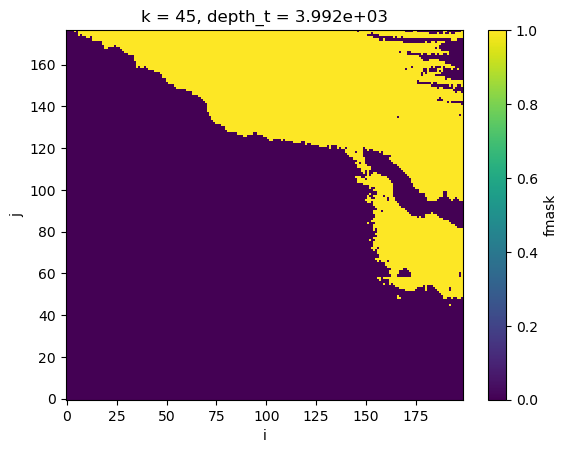

In [4]:
ds = ds.assign(fmask = ds.uf.isel(time=0,drop=True).notnull())
ds.fmask.isel(k=45).plot()

In [5]:
ds = ds.assign(
    tmask=(
        ds.fmask.shift(i=0,j=0)
        | ds.fmask.shift(i=-1,j=-1).fillna(False)
        | ds.fmask.shift(i=0, j=-1).fillna(False)
        | ds.fmask.shift(i=-1,j=-1).fillna(False)
    ).astype(bool)
)
ds

<xarray.Dataset> Size: 144MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

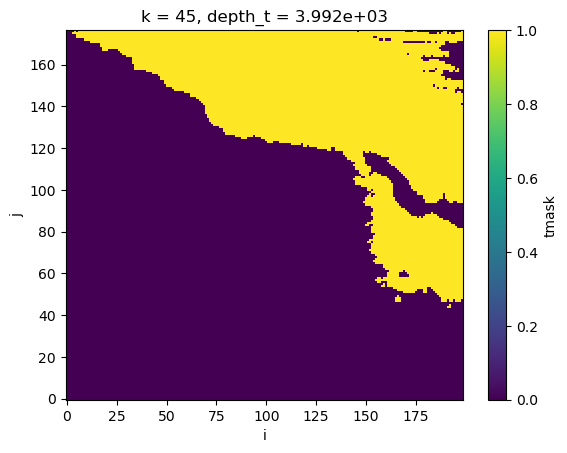

In [6]:
ds.tmask.isel(k=45).plot()

### Calculate U and V faces

In [7]:
ds = ds.assign(
    u=(ds.uf.fillna(0) + ds.uf.shift(j=-1).fillna(0)) /2,
    v=(ds.vf.fillna(0) + ds.vf.shift(i=-1).fillna(0)) /2,
)
ds

<xarray.Dataset> Size: 285MB
Dimensions:      (time: 10, k: 50, j: 177, i: 199)
Coordinates:
  * time         (time) datetime64[ns] 80B 2021-06-01 2021-06-02 ... 2021-06-10
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
Data variables:
    uf           (time, k, j, i) float32 70MB ...
    vf           (time, k, j, i) float32 70MB ...
    fmask        (k, j, i) bool 2MB False False False ... False False False
    tmask        (k, j, i) bool 2MB False False False ... False False False
    u            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    v            (time, k, j, i) float32 70MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    Conventions:       CF-1.11
    title:             daily mean fields from Global Ocean Physics Analysis a...
    institution:       MERCATOR OCEAN
    source:            MERCATOR GLORYS12V1
    history:           2023/06/01 16:20:05 MERCATOR OCEAN Netcdf creation
    references:        http://www.mercator-ocean.fr
    comment:           CMEMS product
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_my_0.083deg_P1D-m_202311
    subset:date:       2025-06-02T10:13:07.838Z

In [8]:
ds.depth_t

<xarray.DataArray 'depth_t' (k: 50)> Size: 200B
array([4.940250e-01, 1.541375e+00, 2.645669e+00, 3.819495e+00,
       5.078224e+00, 6.440614e+00, 7.929560e+00, 9.572997e+00,
       1.140500e+01, 1.346714e+01, 1.581007e+01, 1.849556e+01,
       2.159882e+01, 2.521141e+01, 2.944473e+01, 3.443415e+01,
       4.034405e+01, 4.737369e+01, 5.576429e+01, 6.580727e+01,
       7.785385e+01, 9.232607e+01, 1.097293e+02, 1.306660e+02,
       1.558507e+02, 1.861256e+02, 2.224752e+02, 2.660403e+02,
       3.181274e+02, 3.802130e+02, 4.539377e+02, 5.410889e+02,
       6.435668e+02, 7.633331e+02, 9.023393e+02, 1.062440e+03,
       1.245291e+03, 1.452251e+03, 1.684284e+03, 1.941893e+03,
       2.225078e+03, 2.533336e+03, 2.865703e+03, 3.220820e+03,
       3.597032e+03, 3.992484e+03, 4.405224e+03, 4.833291e+03,
       5.274784e+03, 5.727917e+03], dtype=float32)
Coordinates:
  * k        (k) int64 400B 0 1 2 3 4 5 6 7 8 9 ... 41 42 43 44 45 46 47 48 49
    depth_t  (k) float32 200B 0.494 1.541 2.646 ... 5.275e+03 5.728e+03

### Integration of W

In [67]:
R = 6371e3  # Radio de la Tierra en metros

# Cargar campos u, v, máscaras y coordenadas para un solo tiempo
u = ds.u.isel(time=0)  # (depth, lat, lon)
v = ds.v.isel(time=0)
tmask = ds.tmask
fmask = ds.fmask

lat = ds.latitude_f
lon = ds.longitude_f
depth = ds.depth_t

# 1. Calcular z_t (centros de celda vertical)
z_t = (depth.shift(k=-1) + depth) / 2
z_t = z_t.isel(k=slice(0, -1))

# 2. Calcular dx y dy en metros
dy = np.deg2rad(lat.diff('latitude_f')) * R
dy = dy.pad(latitude_f=(0,0), mode='edge')

dx = np.deg2rad(lon.diff('longitude_f')) * R * np.cos(np.deg2rad(lat))
dx = dx.pad(longitude_f=(0,0), mode='edge')

# 3. Calcular dz
dz = depth.diff('depth_t')  # tamaño Nz-1

# 4. Expandir dimensiones
dx_3d = dx.broadcast_like(u)
dy_3d = dy.broadcast_like(v)
dz_3d = dz.broadcast_like(u)

# dy_3d['depth_t']=F_v.depth_t
# 5. Calcular flujos y aplicar tmask
F_u = (u * dy_3d * dz_3d).where(tmask == 1)
F_v = (v * dx_3d * dz_3d).where(tmask == 1)

In [68]:
# 6. Divergencia horizontal
dF_u_dx = (F_u.shift(i=-1) - F_u) / dx_3d
dF_v_dy = (F_v.shift(j=-1) - F_v) / dy_3d
div_flux = (dF_u_dx + dF_v_dy).where(tmask == 1)

# 7. Integración bottom-up
integrand = -div_flux.isel(k=slice(0, -1))
dz_3d_mid = dz_3d.isel(k=slice(0, -1))
integrand = integrand * dz_3d_mid

w_bottom_up = integrand.isel(k=slice(None, None, -1)).cumsum(dim='k', skipna=True)

/sw/spack-levante/miniforge3-24.11.3-2-Linux-x86_64-hbhytx/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:57: RuntimeWarning: invalid value encountered in accumulate
  return bound(*args, **kwds)


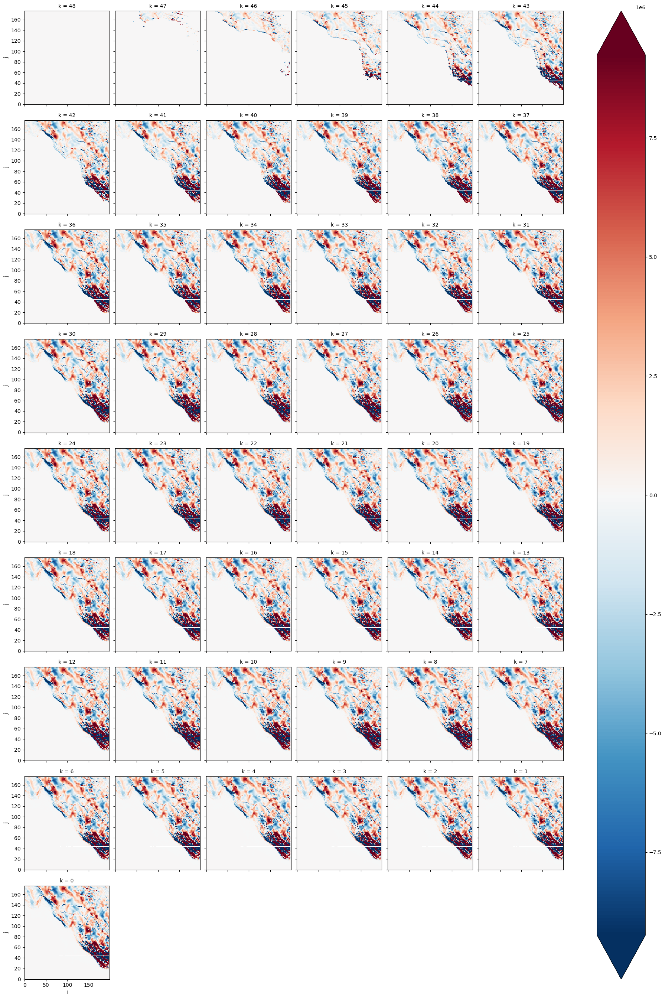

In [69]:
w_bottom_up.plot(x='i',y='j',col='k',col_wrap=6, robust=True)

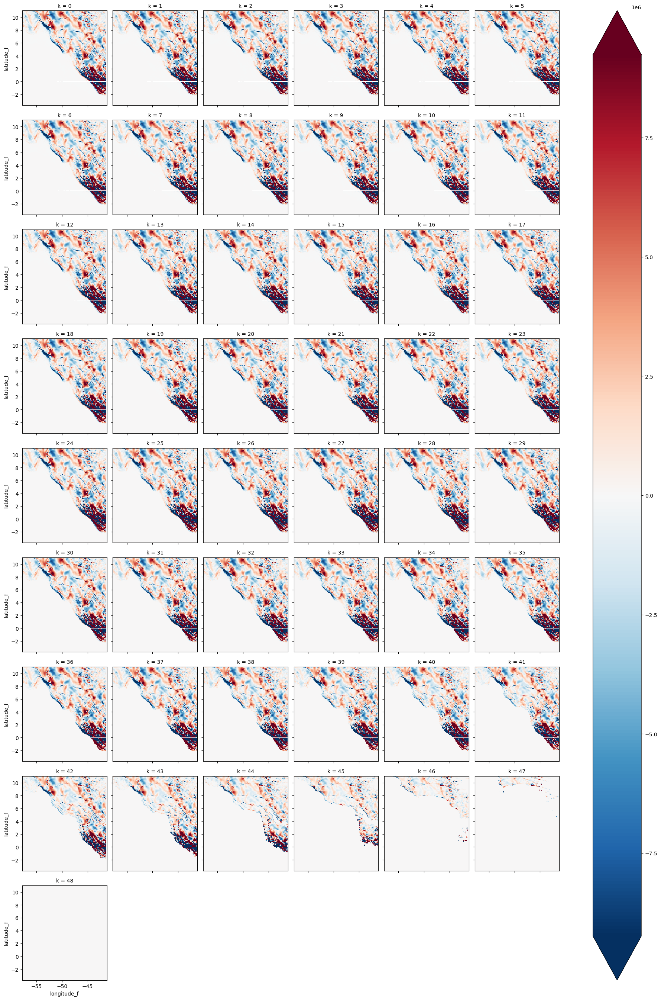

In [70]:
w_bottom_up_r = w_bottom_up.isel(k=slice(None, None, -1))  # reverse
w_bottom_up_r.plot(x='longitude_f',y='latitude_f',col='k',col_wrap=6, robust=True)

In [71]:
# Aplicar fmask (corrige zonas sin agua en w)
w_bu = w_bottom_up_r.where(tmask == 1)

# 8. Interpolación al centro si lo necesitas
# w_FV = ((w_bottom_up + w_bottom_up.shift(k=-1)) / 2).fillna(0)
# w_FV = w_FV.where((w_FV != 0) & (tmask == 1))
# w_FV.name = "w_FV"

# 9. Calcular área y dividir para obtener w [m/s]
area_3d = dx_3d * dy_3d
area_3d = area_3d.interp(k=w_bu.k)

w = (w_bu / area_3d).where(tmask == 1)
w.name = 'w_vertical'

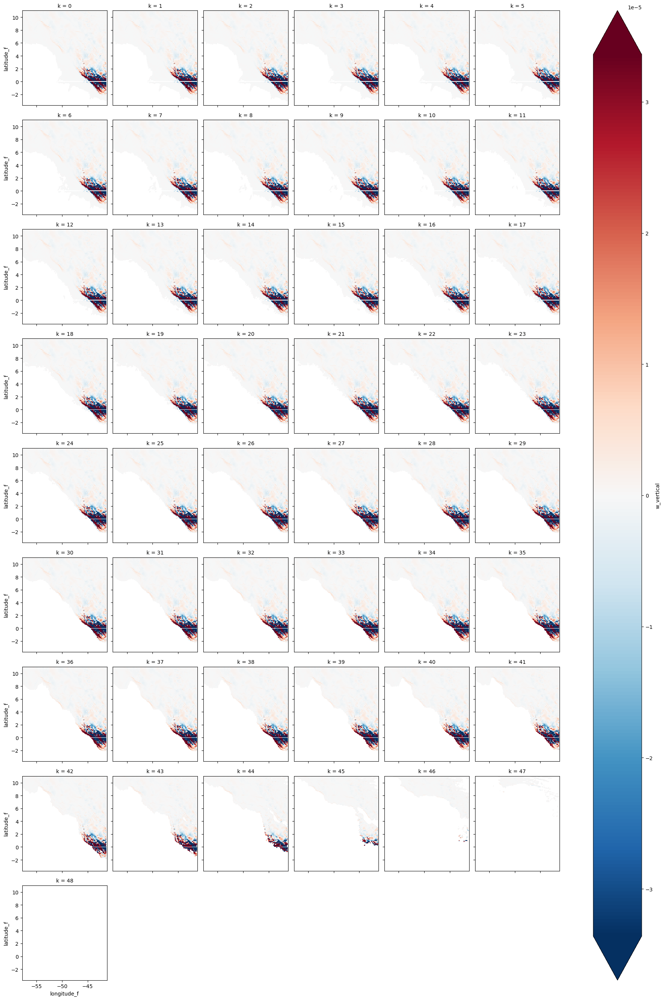

In [72]:
w.plot(x='longitude_f',y='latitude_f',col='k',col_wrap=6, robust=True)

In [16]:
# ============================================
# Z calculation
# ============================================
z_t_np = z_t.values
z_w = np.zeros(len(z_t_np) + 1)
z_w[0] = 0

for k in range(1, len(z_w)):
    z_w[k] = z_w[k - 1] + 2 * (z_t_np[k - 1] - z_w[k - 1])

z_w_da = xr.DataArray(z_w, dims=['depth'], name='z_w')

In [17]:
z_w_da=z_w_da.rename({"depth": "k"})
z_w_da

<xarray.DataArray 'z_w' (k: 50)> Size: 400B
array([0.00000000e+00, 2.03539991e+00, 2.15164423e+00, 4.31351995e+00,
       4.58419943e+00, 6.93463945e+00, 7.43553495e+00, 1.00670228e+01,
       1.09109740e+01, 1.39611650e+01, 1.53160453e+01, 1.89895844e+01,
       2.11047950e+01, 2.57054353e+01, 2.89507079e+01, 3.49281754e+01,
       3.98500228e+01, 4.78677201e+01, 5.52702651e+01, 6.63012910e+01,
       7.73598266e+01, 9.28201051e+01, 1.09235269e+02, 1.31160025e+02,
       1.55356668e+02, 1.86619620e+02, 2.21981180e+02, 2.66534323e+02,
       3.17633401e+02, 3.80707053e+02, 4.53443704e+02, 5.41582907e+02,
       6.43072855e+02, 7.63827048e+02, 9.01845315e+02, 1.06293398e+03,
       1.24479698e+03, 1.45274502e+03, 1.68379014e+03, 1.94238686e+03,
       2.22458384e+03, 2.53383022e+03, 2.86520884e+03, 3.22131411e+03,
       3.59653794e+03, 3.99297768e+03, 4.40473033e+03, 4.83378530e+03,
       5.27428990e+03, 5.72841128e+03])
Dimensions without coordinates: k

In [174]:
# zero_layer = xr.zeros_like(w_bottom_up.isel(k=0)).expand_dims(k=[-1])
zero_layer = xr.zeros_like(w_bottom_up.isel(k=0)).expand_dims(k=1)

# # Paso 2: concatenar al inicio
w_ = xr.concat([zero_layer, w_bottom_up_r], dim='k')

# # Paso 3: reasignar índice k como 0,1,2,...N
w_ = w_.assign_coords(k=np.arange(w_.sizes['k']))


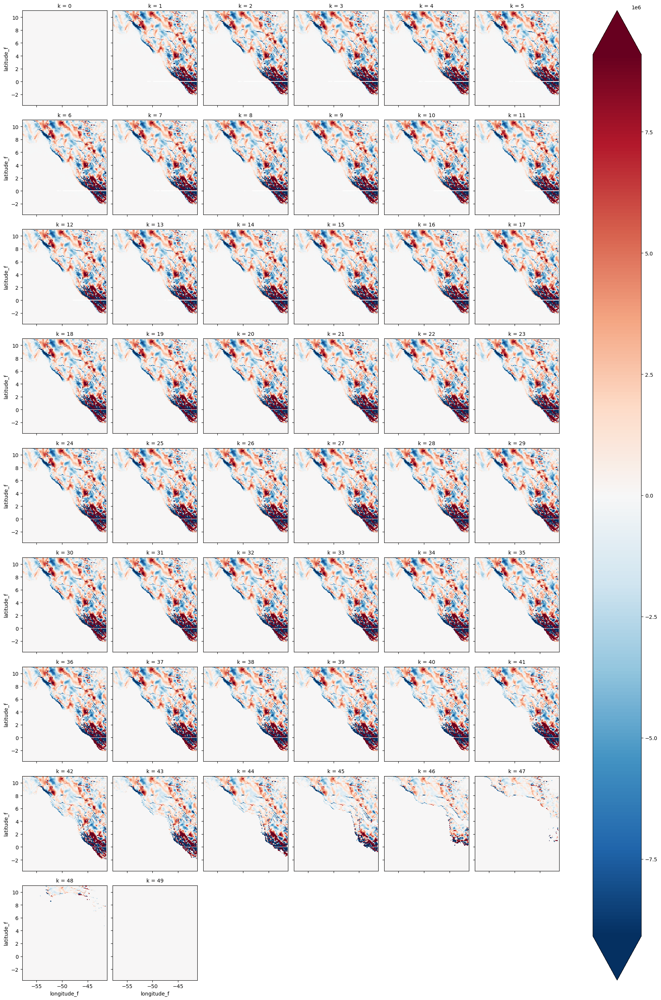

In [175]:
w_.plot(x='longitude_f',y='latitude_f',col='k',col_wrap=6, robust=True)

In [183]:
# Asignar coordenadas y corregir w(z=0)=0
w_ = w_.assign_coords(depth_t=z_w_da)
w_.name = 'w_bottom_up'
w_

<xarray.DataArray 'w_bottom_up' (k: 50, j: 177, i: 199)> Size: 7MB
array([[[       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        ...,
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ]],

       [[       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
...
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ]],

       [[       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        ...,
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ],
        [       0.   ,        0.   ,        0.   , ...,        0.   ,
                0.   ,        0.   ]]],
      shape=(50, 177, 199), dtype=float32)
Coordinates:
    time         datetime64[ns] 8B 2021-06-01
  * j            (j) int64 1kB 0 1 2 3 4 5 6 7 ... 170 171 172 173 174 175 176
  * i            (i) int64 2kB 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198
    depth_t      (k) float64 400B 0.0 2.035 2.152 ... 5.274e+03 5.728e+03
    latitude_f   (j) float32 708B -3.667 -3.583 -3.5 -3.417 ... 10.83 10.92 11.0
    longitude_f  (i) float32 796B -57.75 -57.67 -57.58 ... -41.42 -41.33 -41.25
  * k            (k) int64 400B 0 1 2 3 4 5 6 7 8 ... 41 42 43 44 45 46 47 48 49
    depth        (k) float64 400B 0.0 2.035 2.152 ... 5.274e+03 5.728e+03

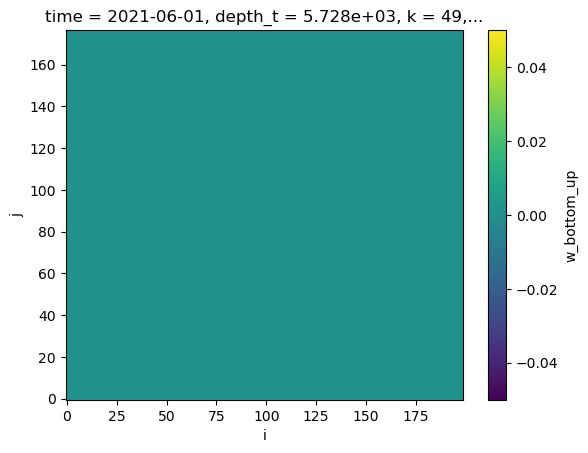

In [189]:
w_surf = w_.isel(k=-2)
w_surf.plot()

In [191]:
z_w_da/z_w_da[-1]

<xarray.DataArray 'z_w' (k: 50)> Size: 400B
array([0.00000000e+00, 3.55316652e-04, 3.75609244e-04, 7.53004585e-04,
       8.00256687e-04, 1.21056941e-03, 1.29800997e-03, 1.75738478e-03,
       1.90471206e-03, 2.43717922e-03, 2.67369861e-03, 3.31498273e-03,
       3.68423180e-03, 4.48735854e-03, 5.05388083e-03, 6.09735820e-03,
       6.95655756e-03, 8.35619473e-03, 9.64844569e-03, 1.15741150e-02,
       1.35045867e-02, 1.62034639e-02, 1.90690339e-02, 2.28964051e-02,
       2.71203761e-02, 3.25779018e-02, 3.87509152e-02, 4.65284894e-02,
       5.54487773e-02, 6.64594482e-02, 7.91569743e-02, 9.45433002e-02,
       1.12260245e-01, 1.33340120e-01, 1.57433758e-01, 1.85554760e-01,
       2.17302305e-01, 2.53603477e-01, 2.93936671e-01, 3.39079505e-01,
       3.88342201e-01, 4.42326869e-01, 5.00175128e-01, 5.62339880e-01,
       6.27842131e-01, 6.97048010e-01, 7.68927040e-01, 8.43826511e-01,
       9.20724725e-01, 1.00000000e+00])
Dimensions without coordinates: k

In [185]:
# w_bottom_up = w_bottom_up - w_surf * (z_w_da / z_w_da[-1])
w_bu = (w_- w_surf) * (z_w_da/z_w_da[-1])

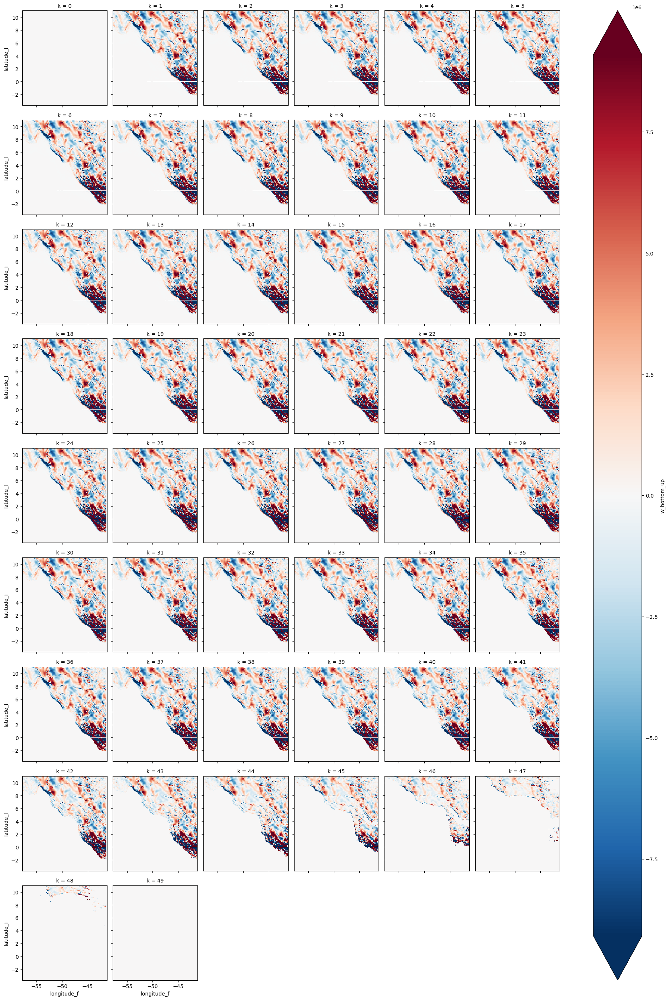

In [187]:
w_.plot(x='longitude_f',y='latitude_f',col='k',col_wrap=6, robust=True)

In [61]:
# Aplicar fmask (corrige zonas sin agua en w)
w_bu = w_.where(tmask == 1)

# 8. Interpolación al centro si lo necesitas
# w_FV = ((w_bottom_up + w_bottom_up.shift(k=-1)) / 2).fillna(0)
# w_FV = w_FV.where((w_FV != 0) & (tmask == 1))
# w_FV.name = "w_FV"

# 9. Calcular área y dividir para obtener w [m/s]
area_3d = dx_3d * dy_3d
area_3d = area_3d.interp(k=w_bu.k)

w = (w_bu / area_3d).where(tmask == 1)
w.name = 'w_vertical'

NameError: name 'w_' is not defined

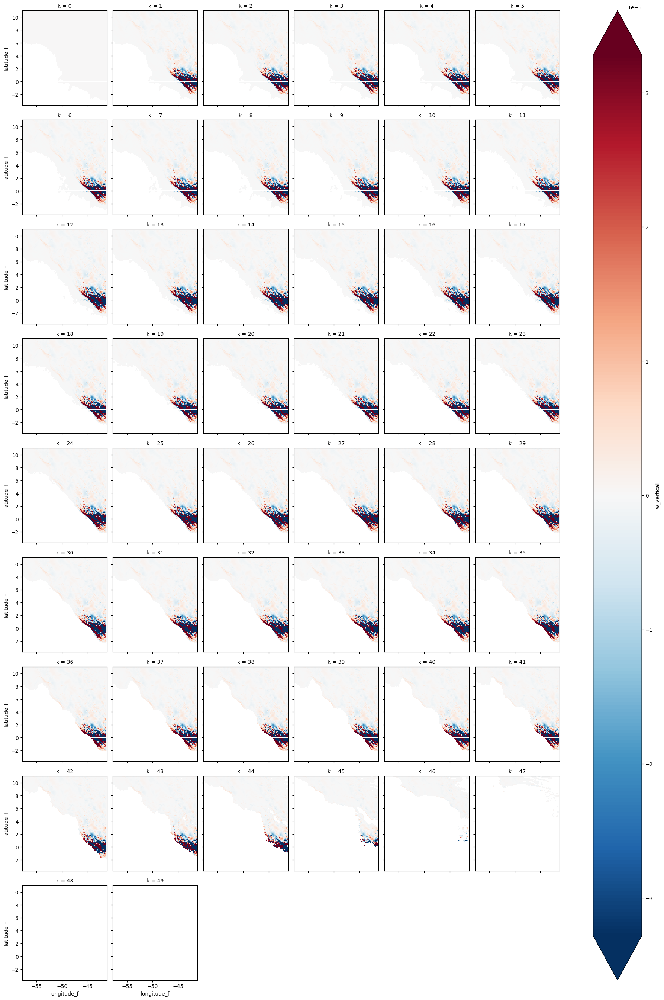

In [223]:
w.plot(x='longitude_f',y='latitude_f',col='k',col_wrap=6, robust=True)

## Plotting

In [57]:
lat_min, lat_max = 8, 10
lon_min, lon_max = -49, -47
#--- Mask for W 
mask = (
    ((w.latitude_f>= lat_min) & (w.latitude_f <= lat_max)) &
    ((w.longitude_f >= lon_min) & (w.longitude_f <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
binary_mask = mask.astype(int)

mask_3f = xr.broadcast(w.isel(k=0)*0 + 1, binary_mask)[1]
mask_3f = mask_3f.where(mask_3f!=0,np.nan)

## ----- max for U,V in the corners
mask = (
    ((ds.latitude_f >= lat_min) & (ds.latitude_f <= lat_max)) &
    ((ds.longitude_f >= lon_min) & (ds.longitude_f <= lon_max))
)

# Convert boolean to integer (1 inside the box, 0 outside)
bmask = mask.astype(int)

# Broadcast to depth
mask_3c = xr.broadcast(ds.u.isel(k=0)*0 + 1, bmask)[1]
mask_3c = mask_3c.where(mask_3c!=0,np.nan)

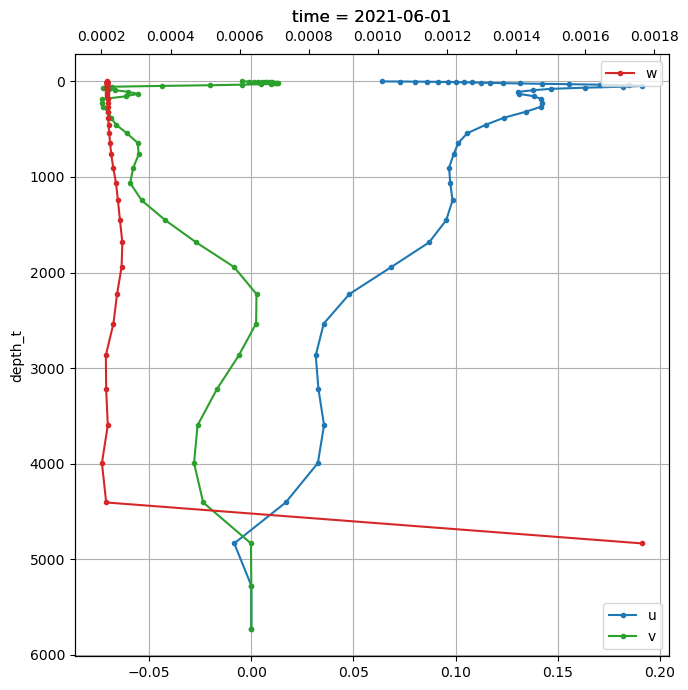

In [60]:
uu = (ds.u * mask_3c).isel(time=0)
vv = (ds.v * mask_3c).isel(time=0)
ww = (w * mask_3f)

fig, ax = plt.subplots(figsize=(7, 7))

# Eje inferior: u y v
uu.mean(dim=('j', 'i'), skipna=True).plot(
    y='depth_t', marker='.', label='u', ax=ax, color='tab:blue')

vv.mean(dim=('j', 'i'), skipna=True).plot(
    y='depth_t', marker='.', label='v', ax=ax, color='tab:green')

# ax.set_ylim(0, 1500)
ax.invert_yaxis()
ax.grid(visible=True)
ax.legend(loc='lower right')

# Eje superior: w
ax2 = ax.twiny()
ww.mean(dim=('j', 'i'), skipna=True).plot(
    y='depth_t', marker='.', label='w', ax=ax2, color='tab:red')

ax2.legend(loc='upper right')
# ax2.set_xlim(-1e-6,1e-6)

plt.tight_layout()
# plt.grid(True)
plt.show()